# Proyecto: Análisis del mercado inmobiliario de la Ciudad de Buenos Aires


Mentor: Javier Lezama.

javitolez@gmail.com

En este proyecto vamos a trabajar con un dataset de propiedades en venta publicadas en el portal www.Properati.com.ar.

#### Autor: Pablo Borja

# El dataset: propiedades en venta en Ciudad de Buenos Aires.

En este proyecto, trabajaremos con una muestra del conjunto de datos de propiedades en venta mencionado. En este dataset, cada fila es una propiedad en venta. 

#Los atributos

A continuación vamos a describir los atributos que consideramos en esta muestra:
* id: id de la propiedad
* created_on: fecha en la que la propiedad ingresó al sitio
* operation: alquiler (rent) o venta (sell)
* property_type: tipo de propiedad (casa, departamento, ph, etcétera)
* place_with_parent_names: nombre del lugar donde se encuentra la propiedad según el publicador
* lat-lon: coordenadas concatenadas
* lat: latitud
* lon: longitud
* price: precio en la moneda especificada en currency
* currency: divisa en la que está expresada la publicación
* price_aprox_usd: precio aproximado en dólares estadounidenses
* surface_total_in_m2: superficie total (en metros cuadrados)
* surface_covered_in_m2: superficie cubierta (en metros cuadrados)
* price_usd_per_m2: precio por metro cuadrado en dólares (precio dólares / superficie)
* floor: número de piso (si corresponde)
* rooms: cantidad de ambientes
* expenses: expensas (si corresponde)
* barrio: barrio según cartografía oficial
* properati_url: url de la publicación en Properati

Objetivos del practico aprendizaje no supervisado:

El objetivo de este práctico es trabajar con el dateset original y realizar un algoritmo de clustering, k-means, y analizar el mismo, con las herramientas vistas en clases.

# Manos a la obra

# Ejercicio

Realizar un algoritmo de clustering, k-means, subre algunos de los labels del dataset original y analizar el mismo. Comparar la cantidad de clusters obtenidos con los reales, asignar etiquetas a los clusters en función de las clases, usar la medida de pureza para comparar cuantitativamente diferentes soluciones, describir el contenido de los clusters, describiendo: qué une en un mismo cluster elementos de distintas clases, por qué se separa la misma clase en diferentes clusters.

Analizar la creación de un embedding (puede ser PCA pero también otro) para obtener otra tanda de soluciones de custering, realizar el mismo análisis sobre esta segunda aproximación, y comparar entre ambas, cuál sería mejor.



In [ ]:
# Comenzando el analisis de clusterizacion

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import numpy as np
from sklearn.metrics import silhouette_score

In [2]:
# Segun este articulo de SO, si los datos categoricos no exhiben orden de importancia alguno.
# se puede utilizar OHE con los datos categoricos.
# Uso los datos ya curados y filtrados.
df_curated = pd.read_csv('./Mentoria Análisis y Curación de Datos/df_filtered.csv')

In [3]:
df_curated.columns

Index(['created_on', 'operation', 'property_type', 'place_with_parent_names',
       'lat-lon', 'lat', 'lon', 'price_aprox_usd', 'surface_total_in_m2',
       'surface_covered_in_m2', 'price_usd_per_m2', 'rooms', 'properati_url',
       'barrio', 'comuna', 'x0_0', 'x0_1', 'x0_2', 'x0_3', 'x1_AGRONOMIA',
       'x1_ALMAGRO', 'x1_BALVANERA', 'x1_BARRACAS', 'x1_BELGRANO', 'x1_BOCA',
       'x1_BOEDO', 'x1_CABALLITO', 'x1_CHACARITA', 'x1_COGHLAN',
       'x1_COLEGIALES', 'x1_CONSTITUCION', 'x1_FLORES', 'x1_FLORESTA',
       'x1_LINIERS', 'x1_MATADEROS', 'x1_MONSERRAT', 'x1_MONTE CASTRO',
       'x1_NUEVA POMPEYA', 'x1_NUEZ', 'x1_PALERMO', 'x1_PARQUE AVELLANEDA',
       'x1_PARQUE CHACABUCO', 'x1_PARQUE CHAS', 'x1_PARQUE PATRICIOS',
       'x1_PATERNAL', 'x1_PUERTO MADERO', 'x1_RECOLETA', 'x1_RETIRO',
       'x1_SAAVEDRA', 'x1_SAN CRISTOBAL', 'x1_SAN NICOLAS', 'x1_SAN TELMO',
       'x1_VELEZ SARSFIELD', 'x1_VERSALLES', 'x1_VILLA CRESPO',
       'x1_VILLA DEL PARQUE', 'x1_VILLA DEVOTO', 'x1

In [4]:
# Revisar que - sea convertido a _ (caracteres ASCII)
colnames = [name for name in df_curated.columns
            if name not in 
            ['created_on', 'operation', 'property_type', 'place_with_parent_names',
             'lat-lon','price_aprox_usd', 'price_usd_per_m2', 'barrio', 'comuna', 'operation',
             'properati_url']]

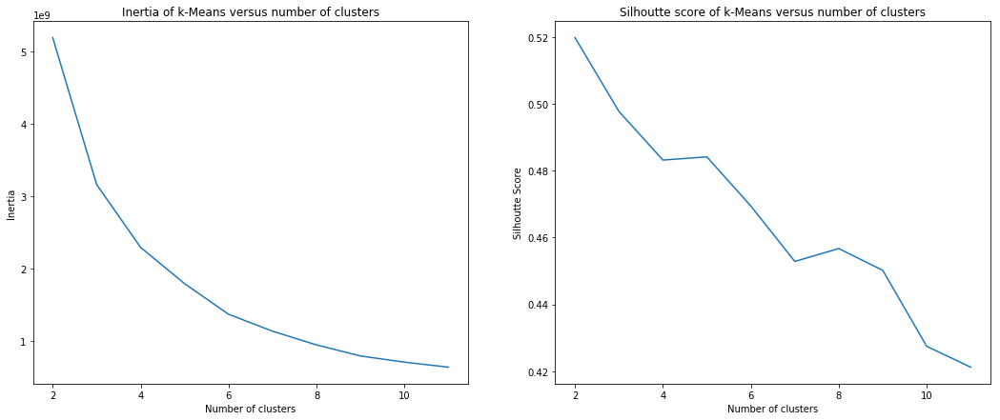

In [5]:
scores = []
sil_score = []
for i in range(10):
    kmeans = KMeans(n_clusters=i+2).fit(df_curated[colnames])
    scores.append(kmeans.inertia_)
    sil_score.append(silhouette_score(df_curated[colnames], kmeans.labels_))

fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_size_inches(18, 7)
ax1.plot(np.arange(2, 12), scores)
ax1.set_xlabel('Number of clusters')
ax1.set_ylabel("Inertia")
ax1.set_title("Inertia of k-Means versus number of clusters")

ax2.plot(np.arange(2, 12), sil_score)
ax2.set_xlabel('Number of clusters')
ax2.set_ylabel("Silhoutte Score")
ax2.set_title("Silhoutte score of k-Means versus number of clusters")

plt.show()

In [ ]:
# NOTA AL MARGEN
# Información de este link.
# https://scikit-learn.org/stable/modules/clustering.html#k-means
# Inertia es una metrica que tiene varias asunciones, como por ejemplo que los clusteres son isotrópicos
# y convexos.
# Por temas de multidimensionalidad las medidas euclideanas tienden a ser sobreestimadas y por lo tanto seria
# conveniente usar una algoritmos de reducción de la dimensionalidad como PCA.

In [6]:
# Asumiendo y tratando de hacer un trade off entre las medidas de silueta y la metrica de inercia del número
# de clusters.
# De los gráficos podemos decir quenos quedamos con 4 clusters
kmeans = KMeans(n_clusters=4).fit(df_curated[colnames])
print(kmeans.inertia_)
print(silhouette_score(df_curated[colnames], kmeans.labels_))

2294312793.3041606
0.48319606304001295


In [ ]:
#n_cluster = 4
# 2294326251.3927903
# 0.4831900771544803

In [7]:
df_curated['label'] = pd.Series(kmeans.labels_)

In [8]:
df_curated.label.value_counts()

0    5554
3    4831
1    2926
2    1820
Name: label, dtype: int64

In [9]:
df_curated.groupby('label').mean()

,property_type,lat,lon,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,rooms,comuna,x0_0,...,x1_VILLA LUGANO,x1_VILLA LURO,x1_VILLA ORTUZAR,x1_VILLA PUEYRREDON,x1_VILLA REAL,x1_VILLA RIACHUELO,x1_VILLA SANTA RITA,x1_VILLA SOLDATI,x1_VILLA URQUIZA,price_m2
label,,,,,,,,,,,,,,,,,,,,,
0,1.033669,-34.604909,-58.436540,194539.902486,87.617753,78.319454,2229.462222,2.843536,7.417897,0.079762,...,0.001801,0.010803,0.011343,0.010443,0.002881,0.000000,0.007742,0.000000,0.029888,2229.462222
1,1.225222,-34.617438,-58.442120,251808.040120,200.386876,166.478654,1375.326934,3.692755,6.958647,0.223513,...,0.023582,0.018113,0.008544,0.014696,0.004443,0.005126,0.009228,0.004101,0.020164,1375.326934
2,1.094505,-34.582323,-58.422077,440976.511912,107.456044,98.254961,4048.461340,2.940659,9.069231,0.006593,...,0.000000,0.000549,0.003297,0.001648,0.000549,0.000000,0.000549,0.000000,0.032418,4048.461340
3,1.057959,-34.590082,-58.433603,261212.155249,86.863382,81.175832,2999.155712,2.795487,8.943283,0.022977,...,0.000414,0.002691,0.012834,0.005589,0.001035,0.000414,0.002484,0.000000,0.048851,2999.155712


In [ ]:
# Tratar de hacer sentido a los grupos.

In [10]:
df_label = df_curated[['lat', 'lon', 'label', 'property_type']]

In [11]:
import folium
from folium.plugins import HeatMap
# Ubicacion obelisco
# -34.6037561,-58.3816139

In [12]:
heat_data0 = [[row['lat'],row['lon']] for index, row in df_label[df_label['label'] == 0].iterrows()]
gmap0 = folium.Map(location=[-34.6075616,-58.437076], zoom_start=12)
HeatMap(heat_data0,radius=10).add_to(gmap0)
gmap0
# gmap.save("myfoliumheatmap0.html")

In [13]:
heat_data1 = [[row['lat'],row['lon']] for index, row in df_label[df_label['label'] == 1].iterrows()]
gmap1 = folium.Map(location=[-34.6075616,-58.437076], zoom_start=12)
HeatMap(heat_data1,radius=10).add_to(gmap1)
gmap1
# gmap.save("myfoliumheatmap1.html")

In [14]:
heat_data2 = [[row['lat'],row['lon']] for index, row in df_label[df_label['label'] == 2].iterrows()]
gmap2 = folium.Map(location=[-34.6075616,-58.437076], zoom_start=12)
HeatMap(heat_data2,radius=10).add_to(gmap2)
gmap2
# gmap.save("myfoliumheatmap2.html")

In [15]:
heat_data3 = [[row['lat'],row['lon']] for index, row in df_label[df_label['label'] == 3].iterrows()]
gmap3 = folium.Map(location=[-34.6075616,-58.437076], zoom_start=12)
HeatMap(heat_data3,radius=10).add_to(gmap3)
gmap3
# gmap.save("myfoliumheatmap0.html")

In [ ]:
# De los datos libres del Gob  de CABA
# Agregar Transporte y Espacios Verdes
! pip install geopandas

In [ ]:
! pip install geopy

In [16]:
import json

markers_geojson='transporte/estaciones-de-ferrocarril.geojson' 
data=json.load(open(markers_geojson))
gmap=folium.Map(location=[-34.6037561,-58.3816139], zoom_start=12)
gmap.add_child(folium.GeoJson(data=data,name='Estaciones')\
               .add_child(folium.Popup("A plain pop up string")))    
# map.save(outfile='test5.html')

In [ ]:
import geopandas as gpd
df_ffcc = gpd.GeoDataFrame(data)

Presentar un informe final con los datos inferidos del dataset utilizando herramientas gráficas y escritas teniendo en cuenta los destinatarios. En este caso colegas de la diplomatura para preparar el informe con un background adecuado al destinatario.

In [56]:
! pip install shapely

In [17]:
# De los datod cargados de CABA, quedarse con los que se encuentran dentro del Poligono.
from  shapely.geometry import Point, Polygon

In [18]:
j = json.load(open("transporte/perimetro.geojson"))
# json_poli = pd.read_json("transporte/perimetro.geojson")

In [19]:
poligono = Polygon(j.get('features')[0].get('geometry').get('coordinates')[0])

In [20]:
# Levantar las ubicaciones de las bocas de subte
bocas_subte = json.load(open("transporte/bocas-de-subte.geojson"))
arr_bocas = [Point(bocas.get('geometry').get('coordinates')) 
             for bocas in bocas_subte.get('features')]
bocas_caba = [b for b in arr_bocas if poligono.contains(b)]

In [21]:
# Agregar los puntos filtrados al mapa
transporte_map = folium.Map(location=[-34.6037561,-58.3816139], zoom_start=12)
feature_group_subte = folium.FeatureGroup("Locations")

for point in bocas_caba:
    feature_group_subte.add_child(folium.CircleMarker(location=[point.y,point.x], radius=2))

transporte_map.add_child(feature_group_subte)

In [22]:
# Levantar ubicaciones de estaciones del tren y metrobus
estaciones_tren =  json.load(open("transporte/estaciones-de-ferrocarril.geojson"))
estaciones_metrobus =  json.load(open("transporte/estaciones-de-metrobus.geojson"))

arr_est_tren = [Point(bocas.get('geometry').get('coordinates')) 
             for bocas in estaciones_tren.get('features')]
est_tren_caba = [b for b in arr_est_tren if poligono.contains(b)]

arr_est_metrobus = [Point(bocas.get('geometry').get('coordinates')) 
             for bocas in estaciones_metrobus.get('features')]
est_metrobus_caba = [b for b in arr_est_metrobus if poligono.contains(b)]

In [23]:
feature_group_tren = folium.FeatureGroup("Estaciones Tren")

for point in est_tren_caba:
    feature_group_tren.add_child(folium.CircleMarker(location=[point.y,point.x], radius=2,
                                                     color='#009933'))

transporte_map.add_child(feature_group_tren)

In [24]:
feature_group_metrobus = folium.FeatureGroup("Estaciones Metrobus")

for point in est_metrobus_caba:
    feature_group_tren.add_child(folium.CircleMarker(location=[point.y,point.x], radius=2,
                                                     color='#ff6600'))

transporte_map.add_child(feature_group_metrobus)

In [25]:
# Agregar info de espacios verdes.
espacios_verdes = pd.read_csv('transporte/espacio-verde-publico.csv')

In [26]:
from shapely import wkt

espacios_verdes['geometry'] = espacios_verdes['WKT'].apply(wkt.loads)

In [27]:
espacios_verdes['centroid'] = espacios_verdes['geometry'].apply(lambda x: x.centroid)

In [28]:
verdes_poli = [row['geometry'] for index, row in espacios_verdes.iterrows()]
verdes_map = folium.Map(location=[-34.6075616,-58.437076], zoom_start=12)

feature_group_verdes = folium.FeatureGroup("Espacios Verdes")

for verdes in verdes_poli:
    # print(verdes)
    feature_group_verdes.add_child(folium.GeoJson(verdes))

verdes_map.add_child(feature_group_verdes)
# HeatMap(heat_data3,radius=10).add_to(gmap3)
# gmap3

In [ ]:
# Se obvia la parte de espacios verdes históricos por el gráfio de los espacios verdes toma mucha memoria
# y a veces incluso en los gŕaficos del notebook no aparecen

In [ ]:
# espacios_verdes_hist = pd.read_csv('transporte/espacio-verde-publico-historico.csv')

In [ ]:
# verdes_poli_hist = [row['geometry'] for index, row in espacios_verdes_hist.iterrows()]
# verdes_map_hist = folium.Map(location=[-34.6075616,-58.437076], zoom_start=12)

# feature_group_verdes_hist = folium.FeatureGroup("Espacios Verdes Historicos")

# for verdes in verdes_poli_hist:
#     # print(verdes)
#     feature_group_verdes_hist.add_child(folium.GeoJson(verdes))

# verdes_map_hist.add_child(feature_group_verdes)

In [227]:
from geopy import distance

min([distance.distance((-34.6075616,-58.437076), (point.y, point.x)).km for point in bocas_caba])

0.7892700460079438

In [238]:
from geopy import distance

def calcular_distancias(x, puntos_subte, puntos_tren, puntos_metrobus, puntos_verdes):
    ''''''
    dist_subte = min([distance.distance((x.x, x.y), (point.y, point.x)).km for point in puntos_subte])
    dist_tren = min([distance.distance((x.x, x.y), (point.y, point.x)).km for point in puntos_tren])
    dist_metrobus = min([distance.distance((x.x, x.y), (point.y, point.x)).km for point in puntos_metrobus])
    dist_punto_verde = min([distance.distance((x.x, x.y), (point.y, point.x)).km for point in puntos_verdes])
    
    return dist_subte, dist_tren, dist_metrobus, dist_punto_verde

In [239]:
%%time
df_curated['dist_subte'], df_curated['dist_tren'], df_curated['dist_metrobus'], df_curated['dist_punto_verde'] = \
zip(*df_curated['lat_lon'].apply(lambda x: calcular_distancias(x, bocas_caba, est_tren_caba, est_metrobus_caba, 
                                                     espacios_verdes['centroid'].tolist())))

CPU times: user 1h 51min 25s, sys: 989 ms, total: 1h 51min 26s
Wall time: 1h 51min 25s


In [213]:
# Casteamos a Point lat_lon
df_curated['lat_lon'] = df_curated['lat_lon'].apply(lambda x: Point(float(x.split(',')[0]), float(x.split(',')[1])))

In [237]:
%%time
calcular_distancias(Point(-34.6075616,-58.437076), bocas_caba, est_tren_caba, est_metrobus_caba, 
                                                     espacios_verdes['centroid'].tolist())

CPU times: user 428 ms, sys: 0 ns, total: 428 ms
Wall time: 426 ms


(0.7892700460079438, 1.4294655147156057, 1.512675719413109, 0.1143599511164456)

In [247]:
colnames = [name for name in df_curated.columns
            if name not in 
            ['created_on', 'operation', 'property_type', 'place_with_parent_names',
             'lat_lon','price_aprox_usd', 'price_usd_per_m2', 'barrio', 'comuna', 'operation_sell',
             'properati_url', 'label']]

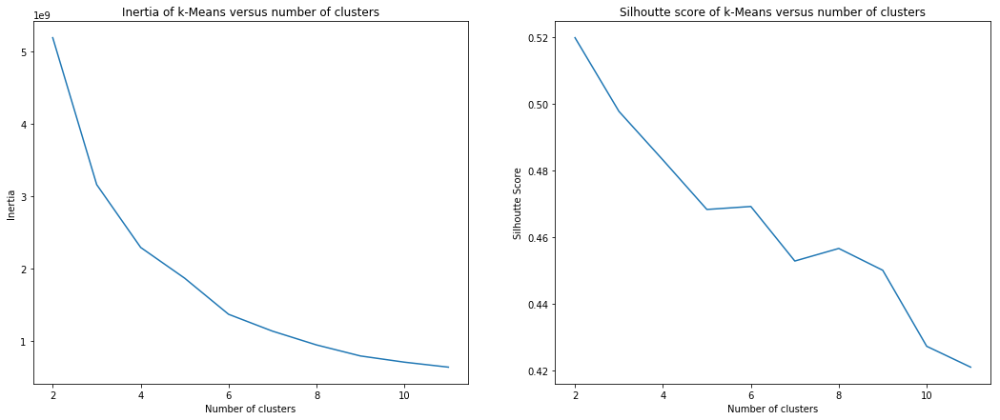

In [248]:
# Recalcular clusters con la nueva data.
scores = []
sil_score = []
for i in range(10):
    kmeans = KMeans(n_clusters=i+2).fit(df_curated[colnames])
    scores.append(kmeans.inertia_)
    sil_score.append(silhouette_score(df_curated[colnames], kmeans.labels_))

fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_size_inches(18, 7)
ax1.plot(np.arange(2, 12), scores)
ax1.set_xlabel('Number of clusters')
ax1.set_ylabel("Inertia")
ax1.set_title("Inertia of k-Means versus number of clusters")

ax2.plot(np.arange(2, 12), sil_score)
ax2.set_xlabel('Number of clusters')
ax2.set_ylabel("Silhoutte Score")
ax2.set_title("Silhoutte score of k-Means versus number of clusters")

plt.show()

In [249]:
kmeans = KMeans(n_clusters=6).fit(df_curated[colnames])
print(kmeans.inertia_)
print(silhouette_score(df_curated[colnames], kmeans.labels_))

df_curated['label'] = pd.Series(kmeans.labels_)

df_curated.label.value_counts()

#Analizar la compisicion de cada cluster

1372259276.8741348
0.4692416473865469


2    4594
0    4002
1    3317
4    1863
5    1354
3       1
Name: label, dtype: int64

In [250]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

from matplotlib.colors import ListedColormap
from sklearn import linear_model , metrics
from sklearn.linear_model import LinearRegression
from sklearn.metrics import accuracy_score, mean_squared_error, r2_score
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.base import BaseEstimator


from scipy import stats

np.random.seed(1234)  # Setup seed to be more deterministic

%matplotlib inline

In [268]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV

In [ ]:
# El clustering en 6 conjutnos no sube el scoring sino que lo baja, testear con el set de valid

In [332]:
df_limpio = pd.read_csv('properati_curado.csv')

In [335]:
# Sacando los dummies
# df_curated.columns #df= df[['surface_total_in_m2','property_type','rooms','surface_covered_in_m2','price_aprox_usd']]

colnames_without_dummies = [name for name in df_limpio.columns
                            if name in 
                            ['surface_total_in_m2','rooms','surface_covered_in_m2','price_aprox_usd',
                            'property_type']]

In [337]:
# Testear para los dos grupos separados
# df_curated_label1 = df_curated[df_curated['label'] == 1]
X = df_limpio[colnames_without_dummies].drop('price_aprox_usd', axis=1)
y = df_limpio[colnames_without_dummies].price_aprox_usd

#Random state sirve para sembrar una "Seed" de como se distribuyen los datos para el algoritmo
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42)

In [338]:
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]

# Minimum number of samples required to split a node
min_samples_split = [2,3,5, 10]

# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

criterion = ['mse','mae','friedman_mse']
splitter = ['best','random']

clf=DecisionTreeRegressor(random_state=42)

random_grid_dtr = {'criterion': criterion,
               'splitter': splitter,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf}

dtr_random = GridSearchCV(clf, 
                          random_grid_dtr, 
                          cv = 3,
                          verbose=5,
                          n_jobs =-1)

In [339]:
# Fit the random search model
dtr_random.fit(X_train, y_train)

print("Mejor conjunto de parámetros:")
print(dtr_random.best_params_)
    
print("\nMejor Estimador:")
print(dtr_random.best_estimator_)
    
print("\nMejor RMSE Score(train):")
print( mean_squared_error(y_train,dtr_random.predict(X_train)))
print("\nMejor RMSE Score (valid):")
print( mean_squared_error(y_valid,dtr_random.predict(X_valid)))
print("\nMejor R2 Score (train):")
print(r2_score(y_train,dtr_random.predict(X_train)))
print("\nMejor R2 Score (valid):")
print(r2_score(y_valid,dtr_random.predict(X_valid)))

Fitting 3 folds for each of 792 candidates, totalling 2376 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done  80 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 965 tasks      | elapsed:   10.8s
[Parallel(n_jobs=-1)]: Done 1178 tasks      | elapsed:   16.6s
[Parallel(n_jobs=-1)]: Done 1340 tasks      | elapsed:   22.5s
[Parallel(n_jobs=-1)]: Done 1538 tasks      | elapsed:   29.7s
[Parallel(n_jobs=-1)]: Done 2376 out of 2376 | elapsed:   33.4s finished


Mejor conjunto de parámetros:
{'criterion': 'mae', 'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 5, 'splitter': 'best'}

Mejor Estimador:
DecisionTreeRegressor(criterion='mae', max_depth=10, max_features=None,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=2,
           min_samples_split=5, min_weight_fraction_leaf=0.0,
           presort=False, random_state=42, splitter='best')

Mejor RMSE Score(train):
1456416878.8303168

Mejor RMSE Score (valid):
2109801228.8453467

Mejor R2 Score (train):
0.9632217347975303

Mejor R2 Score (valid):
0.9383538699833143


In [347]:
df_mixed = df_limpio.merge(df_curated[['lat', 'lon', 'dist_subte', 'dist_tren', 'dist_metrobus', 'dist_punto_verde']],
                           on=['lat','lon'])

In [349]:
# Sacando los dummies
# df_curated.columns #df= df[['surface_total_in_m2','property_type','rooms','surface_covered_in_m2','price_aprox_usd']]

colnames_without_dummies = [name for name in df_mixed.columns
                            if name in 
                            ['surface_total_in_m2','rooms','surface_covered_in_m2','price_aprox_usd',
                            'property_type', 'dist_subte', 'dist_tren', 'dist_metrobus', 'dist_punto_verde']]

In [350]:
# Testear para los dos grupos separados
# df_curated_label1 = df_curated[df_curated['label'] == 1]
X = df_mixed[colnames_without_dummies].drop('price_aprox_usd', axis=1)
y = df_mixed[colnames_without_dummies].price_aprox_usd

#Random state sirve para sembrar una "Seed" de como se distribuyen los datos para el algoritmo
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42)

In [351]:
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]

# Minimum number of samples required to split a node
min_samples_split = [2,3,5, 10]

# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

criterion = ['mse','mae','friedman_mse']
splitter = ['best','random']

clf=DecisionTreeRegressor(random_state=42)

random_grid_dtr = {'criterion': criterion,
               'splitter': splitter,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf}

dtr_random = GridSearchCV(clf, 
                          random_grid_dtr, 
                          cv = 3,
                          verbose=5,
                          n_jobs =-1)

In [352]:
# Fit the random search model
dtr_random.fit(X_train, y_train)

print("Mejor conjunto de parámetros:")
print(dtr_random.best_params_)
    
print("\nMejor Estimador:")
print(dtr_random.best_estimator_)
    
print("\nMejor RMSE Score(train):")
print( mean_squared_error(y_train,dtr_random.predict(X_train)))
print("\nMejor RMSE Score (valid):")
print( mean_squared_error(y_valid,dtr_random.predict(X_valid)))
print("\nMejor R2 Score (train):")
print(r2_score(y_train,dtr_random.predict(X_train)))
print("\nMejor R2 Score (valid):")
print(r2_score(y_valid,dtr_random.predict(X_valid)))

Fitting 3 folds for each of 792 candidates, totalling 2376 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 408 tasks      | elapsed:    6.4s
[Parallel(n_jobs=-1)]: Done 883 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 1048 tasks      | elapsed: 15.5min
[Parallel(n_jobs=-1)]: Done 1246 tasks      | elapsed: 27.2min
[Parallel(n_jobs=-1)]: Done 1480 tasks      | elapsed: 41.3min
[Parallel(n_jobs=-1)]: Done 1750 tasks      | elapsed: 47.3min
[Parallel(n_jobs=-1)]: Done 2056 tasks      | elapsed: 47.5min


Mejor conjunto de parámetros:
{'criterion': 'mse', 'max_depth': 30, 'min_samples_leaf': 2, 'min_samples_split': 5, 'splitter': 'random'}

Mejor Estimador:
DecisionTreeRegressor(criterion='mse', max_depth=30, max_features=None,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=2,
           min_samples_split=5, min_weight_fraction_leaf=0.0,
           presort=False, random_state=42, splitter='random')

Mejor RMSE Score(train):
120713791.1978192

Mejor RMSE Score (valid):
300857298.7354855

Mejor R2 Score (train):
0.9962785950896784

Mejor R2 Score (valid):
0.9903294973590655


[Parallel(n_jobs=-1)]: Done 2376 out of 2376 | elapsed: 47.6min finished


In [ ]:
# Recalcular clusters con la nueva data.
scores = []
sil_score = []
for i in range(10):
    kmeans = KMeans(n_clusters=i+2).fit(df_mixed[colnames])
    scores.append(kmeans.inertia_)
    sil_score.append(silhouette_score(df_mixed[colnames], kmeans.labels_))

fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_size_inches(18, 7)
ax1.plot(np.arange(2, 12), scores)
ax1.set_xlabel('Number of clusters')
ax1.set_ylabel("Inertia")
ax1.set_title("Inertia of k-Means versus number of clusters")

ax2.plot(np.arange(2, 12), sil_score)
ax2.set_xlabel('Number of clusters')
ax2.set_ylabel("Silhoutte Score")
ax2.set_title("Silhoutte score of k-Means versus number of clusters")

plt.show()

### Pasos a seguir.

Como pasos posteriores resta agregar mas features dado la cantidad de dataset públicos de la CABA.

Para una extension a otros puntos en el pais, estaria bueno contar con información de los servicions públicos disponibles como gas natural, cloacas o agua de red.

Utilizar otros algoritmos como puede ser Minibatch Kmeans, Aglomerative Clustering que toman otras tipos de distancias.

Utlizar otros modelos para ver si son más adecuados para el caso de uso (variables numericas y categoricas mezcladas)
Como por ej. K-modes, K-prototypes, Kamila.

Tratar de implementar lo sugerido por :
en el articulo de Estimating Residential Property Values on the Basis of Clustering and Geostatistics (Beata Calka, 2019), crear dos modelos uno para las información estructural, y otro para la geoespacial.


Links en los que se baso el trabajo de No Supervisado.
=====================================================

RECURSOS

https://nominatim.openstreetmap.org/

http://geojson.io

https://leafletjs.com/

https://geopy.readthedocs.io/en/stable/#

https://shapely.readthedocs.io/en/stable/manual.html


https://programminghistorian.org/en/lessons/mapping-with-python-leaflet

https://python-visualization.github.io/folium/quickstart.html

https://dpmartin42.github.io/posts/r/cluster-mixed-types

https://datascience.stackexchange.com/questions/22/k-means-clustering-for-mixed-numeric-and-categorical-data

https://cran.r-project.org/web/packages/kamila/kamila.pdf

https://towardsdatascience.com/clustering-on-mixed-type-data-8bbd0a2569c3

https://blog.floydhub.com/introduction-to-k-means-clustering-in-python-with-scikit-learn/


DATOS

https://data.buenosaires.gob.ar/dataset/espacios-verdes

https://data.buenosaires.gob.ar/dataset/estaciones-ferrocarril

https://data.buenosaires.gob.ar/dataset/metrobus

https://data.buenosaires.gob.ar/dataset/subte-estaciones


In [ ]:
# INFORME ESCRITO

# Este fue el rtabajo en el que más se invirtió tiempo debido a que me causó mucha curiosidad el hecho
# de poder dar sentido a otro tipo de info como puede ser la geográfica, localización y distancias a puntos
# de concurrencia masiva.
# Todavia queda mucho trabajo por hacer, per las conclusiones que se pueden sacar fueron que agregando más
# información a cerca de distancias a espacios verdes o estaciones de tren y demás, no parece hacer incrementado el
# score en los algoritmos de aprendizaje aplicados.
# Por el contrario parece ser que los empeora.
# Una razón posible de este comprtamiento puede ser que ambas tipos de información la estructurada y la GIS tengan
# comportamientos totalmente diferentes por lo, según recomiendan algunos papers, crear dos modelos apartes para 
# tipo de información y asi de esa manera pueda agregar algo de valor.
# Luego que a pesar de no haber sumado al aprendizaje de los algoritmos, la información pública es sumamente
# importante, no sólo para este trabajao sino para cualquier otro, y que es capaz de agregar valor.
# 